### Read and explore the datasets

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')


In [2]:
#Read datasets, no description available. ALl files available at 
# http://www.tsb.gc.ca/eng/stats/aviation/data-5.html. Adding conditions as warning
# received: Columns (+30 in total)have mixed types. Specify dtype option on 
# import or set low_memory=False.
#movements source: https://www150.statcan.gc.ca/t1/tbl1/en/tv.action?pid=2310001801


df1 = pd.read_csv('ASISdb_MDOTW_VW_OCCURRENCE_PUBLIC.csv') 
#                   sep=',', error_bad_lines=False, index_col=False, dtype='unicode')
df2 = pd.read_csv('ASISdb_MDOTW_VW_AIRCRAFT_PUBLIC.csv')
#                  sep=',', error_bad_lines=False, index_col=False, dtype='unicode')
df3 = pd.read_csv('ASISdb_MDOTW_VW_EVENTS_AND_PHASES_PUBLIC.csv')
#df4 = pd.read_csv('ASISdb_MDOTW_VW_SURVIVABILITY_PUBLIC.csv')
dfo = pd.read_csv('23100018.csv')


#### Full definition of contents  <http://www.tsb.gc.ca/eng/stats/aviation/2016/ssea-ssao-2016.html>
<script src="http://www.tsb.gc.ca/includes/js/i18n/en.min.js"></script>

In [3]:
#Rename occid
df2 = df2.rename(index=str, columns={"occid": "OccID"})

In [4]:
df2.shape

(57227, 194)

In [5]:
df1.shape

(47226, 246)

In [6]:
df1.head()

,OccID,OccNo,AirportID,AirportID_AirportName,AirportID_CountryID,AirportID_CountryID_DisplayEng,AirportID_CountryID_DisplayFre,Airport_ProvinceID,AirportID_ProvinceID_DisplayEng,AirportID_ProvinceID_DisplayFre,...,InitialPositionEnum_DisplayFre,FinalPositionEnum,FinalPositionEnum_DisplayEng,FinalPositionEnum_DisplayFre,FullProcedureIND,FullProcedureIND_DisplayEng,FullProcedureIND_DisplayFre,SurfaceContaminationID,SurfaceContaminationID_DisplayEng,SurfaceContaminationID_DisplayFre
0,152828,A19P0071,1984.0,Erik Nielsen Intl,2.0,CANADA,CANADA,24.0,YUKON,YUKON,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,152827,A19W0070,1984.0,Erik Nielsen Intl,2.0,CANADA,CANADA,24.0,YUKON,YUKON,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,152827,A19W0070,1984.0,Erik Nielsen Intl,2.0,CANADA,CANADA,24.0,YUKON,YUKON,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,152826,A19P0070,109.0,(CAMPBELL ISLAND),2.0,CANADA,CANADA,12.0,BRITISH COLUMBIA,COLOMBIE-BRITANNIQUE,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,152825,A19P0069,1912.0,Vancouver Intl,2.0,CANADA,CANADA,12.0,BRITISH COLUMBIA,COLOMBIE-BRITANNIQUE,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [7]:
df3.shape

(105506, 14)

### Finding unique values on datasets

In [8]:
df1u = df1.OccID.nunique()

In [9]:
df2u = df2.OccID.nunique()

In [10]:
df3u = df3.OccID.nunique()

In [11]:
unique_ = pd.DataFrame({'Dataset' :["AC","EVE", "PHA"],#"OCC","SUR"], 
                        "Unique":[df1u,df2u, df3u]})
unique_.sort_values(by="Unique", ascending=False)

,Dataset,Unique
0,AC,43855
1,EVE,43854
2,PHA,43814


### Merging the three datasets with relevant information

In [12]:
# dfm = df1.merge(df2, how='left', left_on=('OccID'), right_on=('OccID'))
# .merge(df3, how='left', left_on=('OccID'), right_on=('OccID')) 

In [13]:
from functools import reduce
dfs = [df1,df2,df3]
dfm = reduce(lambda left,right: pd.merge(left,right, on='OccID'), dfs)

In [14]:
dfm #dfm.TotalFatalCount

,OccID,OccNo_x,AirportID,AirportID_AirportName,AirportID_CountryID,AirportID_CountryID_DisplayEng,AirportID_CountryID_DisplayFre,Airport_ProvinceID,AirportID_ProvinceID_DisplayEng,AirportID_ProvinceID_DisplayFre,...,EventPhaseSequence,EventID_DisplayEng,EventID_DisplayFre,FullEventDescEng,FullEventDescFre,PhaseID,PhaseID_DisplayEng,PhaseID_DisplayFre,FullPhaseDescEng,FullPhaseDescFre
0,152828,A19P0071,1984.0,Erik Nielsen Intl,2.0,CANADA,CANADA,24.0,YUKON,YUKON,...,1,Flight crew incapacitation/illness/medical issue,Maladie/Incapacité de l'équipage de conduite,[Aircraft operation general].[Flight crew].[Fl...,[Exploitation de l'aéronef - général].[Équipag...,184.0,Cruise,Croisière,[POWERED FIXED-WING AIRCRAFT].[En-route].[Cruise],[Aéronef à voilure fixe - motorisé].[En route]...
1,152827,A19W0070,1984.0,Erik Nielsen Intl,2.0,CANADA,CANADA,24.0,YUKON,YUKON,...,1,Smoke - Passenger cabin,Fumée - Cabine passagers,[Aircraft/system/component related event (Airc...,[Evénement aéronef/système/composant (Aéronef/...,211.0,Standing : Engine(s) Shut Down,Stationné - arrêt du moteur,[POWERED FIXED-WING AIRCRAFT].[Standing].[Stan...,[Aéronef à voilure fixe - motorisé].[Stationne...
2,152827,A19W0070,1984.0,Erik Nielsen Intl,2.0,CANADA,CANADA,24.0,YUKON,YUKON,...,2,Smoke - Cockpit,Fumée - Poste de pilotage,[Aircraft/system/component related event (Airc...,[Evénement aéronef/système/composant (Aéronef/...,211.0,Standing : Engine(s) Shut Down,Stationné - arrêt du moteur,[POWERED FIXED-WING AIRCRAFT].[Standing].[Stan...,[Aéronef à voilure fixe - motorisé].[Stationne...
3,152827,A19W0070,1984.0,Erik Nielsen Intl,2.0,CANADA,CANADA,24.0,YUKON,YUKON,...,3,Smoke - APU,Fumée - APU,[Aircraft/system/component related event (Airc...,[Evénement aéronef/système/composant (Aéronef/...,211.0,Standing : Engine(s) Shut Down,Stationné - arrêt du moteur,[POWERED FIXED-WING AIRCRAFT].[Standing].[Stan...,[Aéronef à voilure fixe - motorisé].[Stationne...
4,152827,A19W0070,1984.0,Erik Nielsen Intl,2.0,CANADA,CANADA,24.0,YUKON,YUKON,...,4,Declared Emergency/Priority/ARFF Standby,Déclaration d'une urgence,[Consequential events].[Declared Emergency/Pri...,"[Evénements résultants, conséquences].[Déclara...",211.0,Standing : Engine(s) Shut Down,Stationné - arrêt du moteur,[POWERED FIXED-WING AIRCRAFT].[Standing].[Stan...,[Aéronef à voilure fixe - motorisé].[Stationne...
5,152827,A19W0070,1984.0,Erik Nielsen Intl,2.0,CANADA,CANADA,24.0,YUKON,YUKON,...,1,Smoke - Passenger cabin,Fumée - Cabine passagers,[Aircraft/system/component related event (Airc...,[Evénement aéronef/système/composant (Aéronef/...,211.0,Standing : Engine(s) Shut Down,Stationné - arrêt du moteur,[POWERED FIXED-WING AIRCRAFT].[Standing].[Stan...,[Aéronef à voilure fixe - motorisé].[Stationne...
6,152827,A19W0070,1984.0,Erik Nielsen Intl,2.0,CANADA,CANADA,24.0,YUKON,YUKON,...,2,Smoke - Cockpit,Fumée - Poste de pilotage,[Aircraft/system/component related event (Airc...,[Evénement aéronef/système/composant (Aéronef/...,211.0,Standing : Engine(s) Shut Down,Stationné - arrêt du moteur,[POWERED FIXED-WING AIRCRAFT].[Standing].[Stan...,[Aéronef à voilure fixe - motorisé].[Stationne...
7,152827,A19W0070,1984.0,Erik Nielsen Intl,2.0,CANADA,CANADA,24.0,YUKON,YUKON,...,3,Smoke - APU,Fumée - APU,[Aircraft/system/component related event (Airc...,[Evénement aéronef/système/composant (Aéronef/...,211.0,Standing : Engine(s) Shut Down,Stationné - arrêt du moteur,[POWERED FIXED-WING AIRCRAFT].[Standing].[Stan...,[Aéronef à voilure fixe - motorisé].[Stationne...
8,152827,A19W0070,1984.0,Erik Nielsen Intl,2.0,CANADA,CANADA,24.0,YUKON,YUKON,...,4,Declared Emergency/Priority/ARFF Standby,Déclaration d'une urgence,[Consequential events].[Declared Emergency/Pri...,"[Evénements résultants, conséquences].[Déclara...",211.0,Standing : Engine(s) Shut Down,Stationné - arrêt du moteur,[POWERED FIXED-WING AIRCRAFT].[Standing].[Stan...,[Aéronef à voilure fixe - motorisé].[Stationne...
9,152826,A19P0070,109.0,(CAMPBELL ISLAND),2.0,CANADA

### Preprocessing dataset 

In [15]:
dfm.shape

(181464, 452)

In [16]:
dfm.head()

,OccID,OccNo_x,AirportID,AirportID_AirportName,AirportID_CountryID,AirportID_CountryID_DisplayEng,AirportID_CountryID_DisplayFre,Airport_ProvinceID,AirportID_ProvinceID_DisplayEng,AirportID_ProvinceID_DisplayFre,...,EventPhaseSequence,EventID_DisplayEng,EventID_DisplayFre,FullEventDescEng,FullEventDescFre,PhaseID,PhaseID_DisplayEng,PhaseID_DisplayFre,FullPhaseDescEng,FullPhaseDescFre
0,152828,A19P0071,1984.0,Erik Nielsen Intl,2.0,CANADA,CANADA,24.0,YUKON,YUKON,...,1,Flight crew incapacitation/illness/medical issue,Maladie/Incapacité de l'équipage de conduite,[Aircraft operation general].[Flight crew].[Fl...,[Exploitation de l'aéronef - général].[Équipag...,184.0,Cruise,Croisière,[POWERED FIXED-WING AIRCRAFT].[En-route].[Cruise],[Aéronef à voilure fixe - motorisé].[En route]...
1,152827,A19W0070,1984.0,Erik Nielsen Intl,2.0,CANADA,CANADA,24.0,YUKON,YUKON,...,1,Smoke - Passenger cabin,Fumée - Cabine passagers,[Aircraft/system/component related event (Airc...,[Evénement aéronef/système/composant (Aéronef/...,211.0,Standing : Engine(s) Shut Down,Stationné - arrêt du moteur,[POWERED FIXED-WING AIRCRAFT].[Standing].[Stan...,[Aéronef à voilure fixe - motorisé].[Stationne...
2,152827,A19W0070,1984.0,Erik Nielsen Intl,2.0,CANADA,CANADA,24.0,YUKON,YUKON,...,2,Smoke - Cockpit,Fumée - Poste de pilotage,[Aircraft/system/component related event (Airc...,[Evénement aéronef/système/composant (Aéronef/...,211.0,Standing : Engine(s) Shut Down,Stationné - arrêt du moteur,[POWERED FIXED-WING AIRCRAFT].[Standing].[Stan...,[Aéronef à voilure fixe - motorisé].[Stationne...
3,152827,A19W0070,1984.0,Erik Nielsen Intl,2.0,CANADA,CANADA,24.0,YUKON,YUKON,...,3,Smoke - APU,Fumée - APU,[Aircraft/system/component related event (Airc...,[Evénement aéronef/système/composant (Aéronef/...,211.0,Standing : Engine(s) Shut Down,Stationné - arrêt du moteur,[POWERED FIXED-WING AIRCRAFT].[Standing].[Stan...,[Aéronef à voilure fixe - motorisé].[Stationne...
4,152827,A19W0070,1984.0,Erik Nielsen Intl,2.0,CANADA,CANADA,24.0,YUKON,YUKON,...,4,Declared Emergency/Priority/ARFF Standby,Déclaration d'une urgence,[Consequential events].[Declared Emergency/Pri...,"[Evénements résultants, conséquences].[Déclara...",211.0,Standing : Engine(s) Shut Down,Stationné - arrêt du moteur,[POWERED FIXED-WING AIRCRAFT].[Standing].[Stan...,[Aéronef à voilure fixe - motorisé].[Stationne...


In [17]:
# Drop duplicates

dfm = dfm.sort_values("OccID", ascending=True)
dfm = dfm.drop_duplicates(subset ="OccID") 
#df.dropna(inplace = True)

In [18]:
dfm.shape

(43814, 452)

In [19]:
dfm.isnull().sum()
#dropped the nulls and update the dataframe
# dfm.shape

OccID                                      0
OccNo_x                                    0
AirportID                              26500
AirportID_AirportName                  26500
AirportID_CountryID                    26500
AirportID_CountryID_DisplayEng         26500
AirportID_CountryID_DisplayFre         26500
Airport_ProvinceID                     26920
AirportID_ProvinceID_DisplayEng        26920
AirportID_ProvinceID_DisplayFre        26920
Location                               26500
Latitude                                1330
LatEnum                                 1332
LatEnum_DisplayEng                      1332
LatEnum_DisplayFre                      1332
Longitude                               1326
LongEnum                                1517
LongEnum_DisplayEng                     1517
LongEnum_DisplayFre                     1517
ICAO                                   26500
BearingID                              41378
BearingID_Abbr                         41378
BearingID_

In [20]:
dfm.shape

(43814, 452)

In [21]:
dfm.dtypes

OccID                                    int64
OccNo_x                                 object
AirportID                              float64
AirportID_AirportName                   object
AirportID_CountryID                    float64
AirportID_CountryID_DisplayEng          object
AirportID_CountryID_DisplayFre          object
Airport_ProvinceID                     float64
AirportID_ProvinceID_DisplayEng         object
AirportID_ProvinceID_DisplayFre         object
Location                                object
Latitude                               float64
LatEnum                                float64
LatEnum_DisplayEng                      object
LatEnum_DisplayFre                      object
Longitude                              float64
LongEnum                               float64
LongEnum_DisplayEng                     object
LongEnum_DisplayFre                     object
ICAO                                    object
BearingID                              float64
BearingID_Abb

In [22]:
dfm.columns

Index(['OccID', 'OccNo_x', 'AirportID', 'AirportID_AirportName',
       'AirportID_CountryID', 'AirportID_CountryID_DisplayEng',
       'AirportID_CountryID_DisplayFre', 'Airport_ProvinceID',
       'AirportID_ProvinceID_DisplayEng', 'AirportID_ProvinceID_DisplayFre',
       ...
       'EventPhaseSequence', 'EventID_DisplayEng', 'EventID_DisplayFre',
       'FullEventDescEng', 'FullEventDescFre', 'PhaseID', 'PhaseID_DisplayEng',
       'PhaseID_DisplayFre', 'FullPhaseDescEng', 'FullPhaseDescFre'],
      dtype='object', length=452)

### Visualization

In [23]:
#importing plotly and cufflinks in offline mode
import plotly as py
import cufflinks as cf
import plotly.graph_objs as go
import plotly.figure_factory as ff
import plotly.offline
import plotly_express as px
import geopandas as gp
import matplotlib.pyplot as plt
import descartes
import seaborn as sns
import missingno as msno
from shapely.geometry import Point, Polygon
from plotly.offline import download_plotlyjs
from plotly.offline import init_notebook_mode
from plotly.offline import plot, iplot
init_notebook_mode(connected=True)
cf.go_offline()
%matplotlib inline

In [24]:
dfm.OccDate

181463     1/9/1976 12:00:00 AM
181461    1/19/1976 12:00:00 AM
181460    2/13/1976 12:00:00 AM
181455    2/16/1976 12:00:00 AM
181453    2/25/1976 12:00:00 AM
181450     3/4/1976 12:00:00 AM
181448     5/5/1976 12:00:00 AM
181446    5/29/1976 12:00:00 AM
181444     6/4/1976 12:00:00 AM
181443     6/5/1976 12:00:00 AM
181442     6/6/1976 12:00:00 AM
181441     6/5/1976 12:00:00 AM
181440    5/24/1976 12:00:00 AM
181438    6/19/1976 12:00:00 AM
181437    6/27/1976 12:00:00 AM
181435    7/18/1976 12:00:00 AM
181434    7/19/1976 12:00:00 AM
181431    7/22/1976 12:00:00 AM
181430    7/29/1976 12:00:00 AM
181429    7/31/1976 12:00:00 AM
181428     8/8/1976 12:00:00 AM
181427    8/12/1976 12:00:00 AM
181426    8/13/1976 12:00:00 AM
181424    8/16/1976 12:00:00 AM
181423    8/22/1976 12:00:00 AM
181421    9/13/1976 12:00:00 AM
181420    9/14/1976 12:00:00 AM
181419    9/18/1976 12:00:00 AM
181417    9/19/1976 12:00:00 AM
181415    9/23/1976 12:00:00 AM
                  ...          
160     

In [25]:
# Accidents, incidents proportion

dfm.OccTypeID_DisplayEng.iplot(kind='histogram', bins=50, theme='white', title='Ocurrences per type')

In [26]:
#Casting OccDate as string for visualization

dfm['OccDate'] = dfm['OccDate'].astype(str)

In [27]:
#Encoding to datetime format

dfm['OccDate'] = pd.to_datetime(dfm['OccDate'])

In [28]:
dfm.shape

(43814, 452)

In [29]:
#Drop duplicates

dfm.duplicated(subset=None, keep="first").sum()
#found two duplicates
dfm.shape

(43814, 452)

In [30]:
#Ocurrences (Accidents and incidents) per year

dfm.OccDate.dt.year.iplot(kind='histogram', bins=50, theme='white', title='Ocurrences per year')

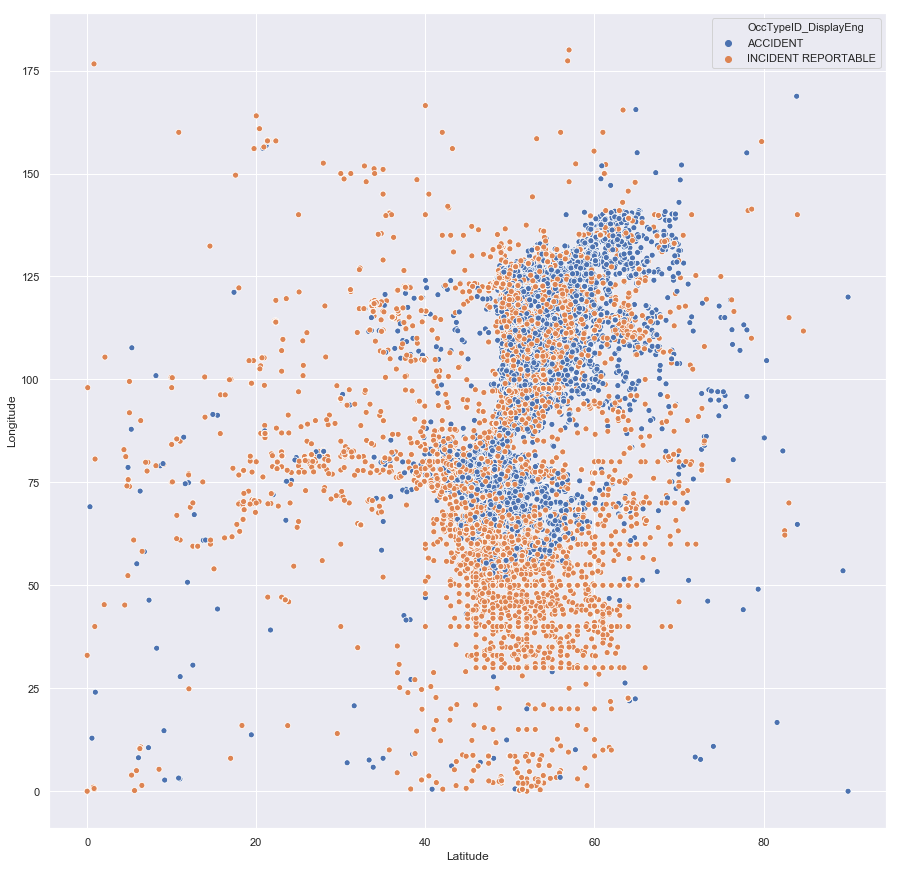

In [57]:
#Lat-Lon map

sns.set(rc={'figure.figsize':(15,15)})
ax = sns.scatterplot(x='Latitude', y= 'Longitude', hue = 'OccTypeID_DisplayEng', data=dfm)


In [32]:
#Occurrences per type of operator

px.histogram(dfm, x='OperatorTypeID_DisplayEng', color='OccTypeID_DisplayEng',template='plotly')

In [33]:
#Filling PhaseID feature's 'blanks' with 0

dfm.PhaseID.fillna(0, inplace=True)

In [34]:
dfm.PhaseID.isna().sum()

0

In [35]:
#Casting PhaseID_DisplayEng as string for visualization

dfm.PhaseID_DisplayEng=dfm.PhaseID_DisplayEng.astype("str")

1


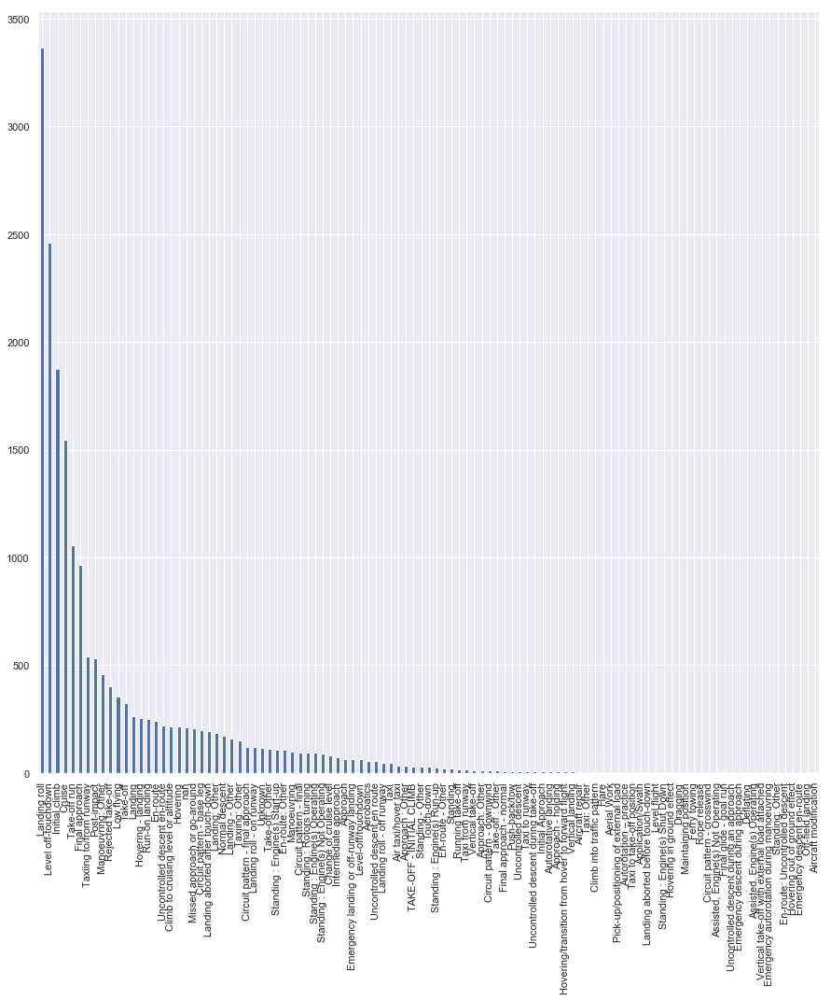

3


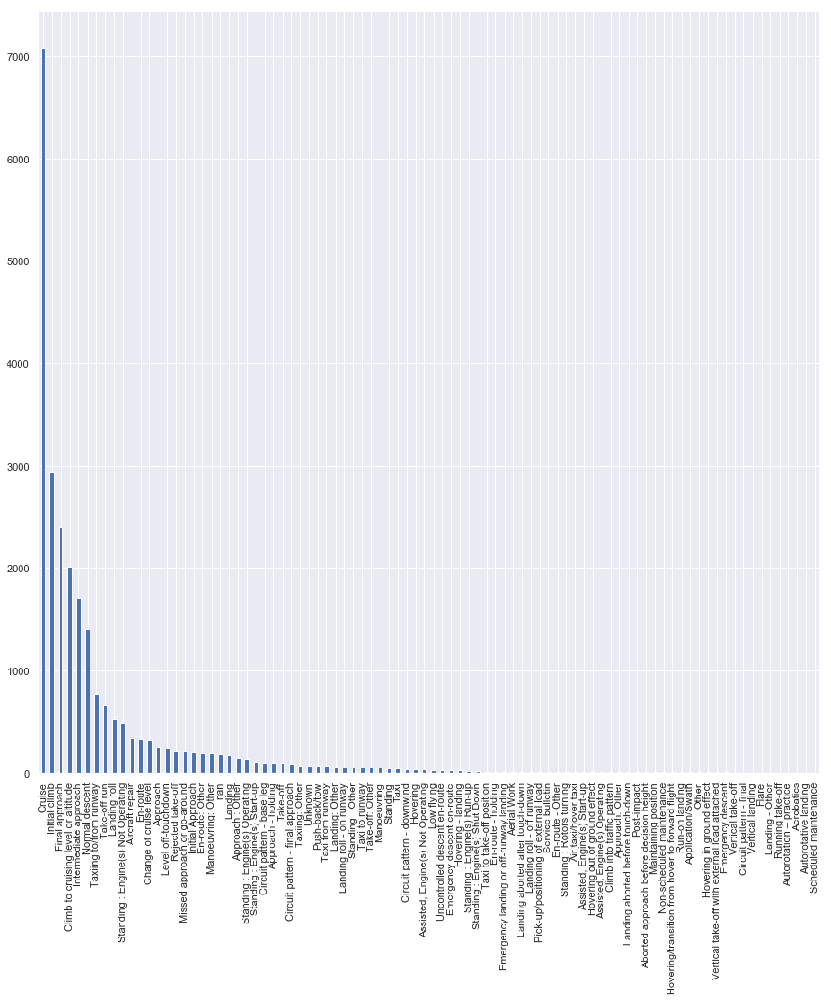

In [56]:
temp=dfm[['PhaseID_DisplayEng', "OccTypeID" ]]
grouper=temp.groupby("OccTypeID")
for i,v in grouper:
    #print(v["PhaseID_DisplayEng"].shape)
    print(i)
    v["PhaseID_DisplayEng"].value_counts().plot.bar(figsize=(15,15))
    plt.show()

In [37]:
temp=dfm[['EventID_DisplayEng', "OccTypeID" ]]
grouper=temp.groupby("OccTypeID")
for i,v in grouper:
    #print(v["PhaseID_DisplayEng"].shape)
    print(v["EventID_DisplayEng"].value_counts())
    #v["EventID_DisplayEng"].value_counts().plot.bar(figsize=(20,200))
    #plt.show()

Aircraft collision - level terrain                      2058
Aeroplane flight path deviation                         1230
Collision aircraft-tree / tall vegetation               1072
Hard landing                                             946
POWER LOSS - FIRST ENGINE                                868
Main landing gear                                        821
Aeroplane - mush/stall                                   777
Nose gear collapsed/retracted                            488
Nosed down/overturned                                    465
Aircraft collision - high terrain                        446
Landing gear                                             425
Aircraft overrun                                         421
Fire                                                     411
Collision aircraft - cable/wire/powerline                382
Aircraft - collisions with obstacle/terrain/aircraft     373
Collision aircraft-other object                          303
Aeroplane - deviation fr

In [38]:
v["EventID_DisplayEng"].value_counts()

Declared Emergency/Priority/ARFF Standby            4138
Diversion - technical reasons                       1617
Separation provision                                1234
INTENTIONAL SHUTDOWN                                 731
POWER LOSS - FIRST ENGINE                            709
Loss of separation: potential collision              666
Smoke                                                663
Hydraulic system                                     522
Flight crew incapacitation/illness/medical issue     515
Landing gear                                         514
Electrical power system                              506
Aircraft - near collisions/loss of separation        460
Aircraft flight control                              435
Loss of separation: risk undetermined                421
Powerplant package                                   418
Aircraft collision - level terrain                   393
Loss of separation: no risk of collision             373
Air Navigation Services        

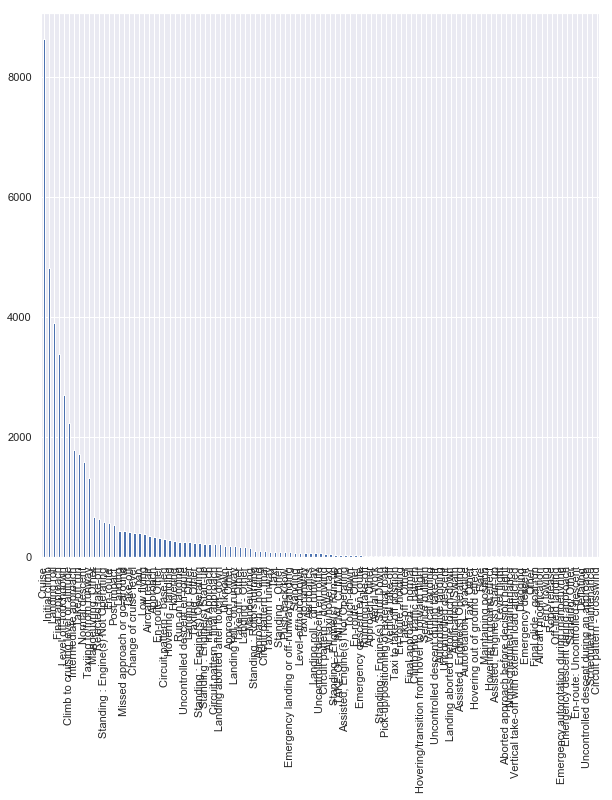

In [39]:
dfm['PhaseID_DisplayEng'].value_counts().plot.bar(figsize=(10,10))

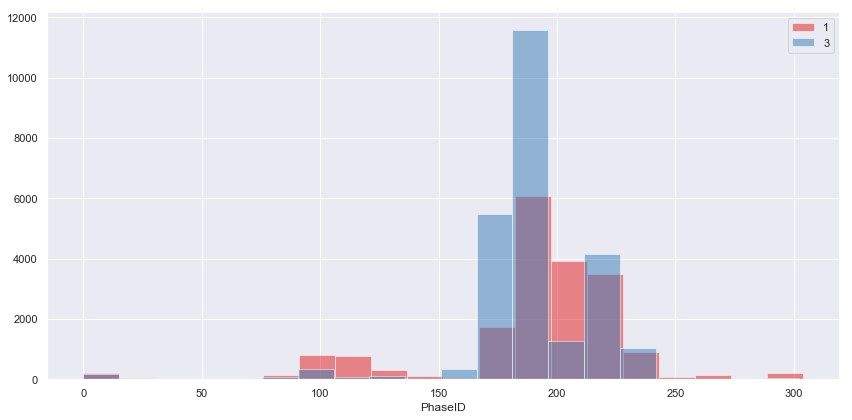

In [40]:
g = sns.FacetGrid(dfm,hue='OccTypeID',palette='Set1',height=6,aspect=2)
g = g.map(plt.hist,'PhaseID',bins=20,alpha=0.5)
plt.legend()

In [41]:
px.scatter(dfm, x='TotalFatalCount', y="OrganizationID_DisplayEng", size='TotalFatalCount', size_max=50)
#Get another graph for <100 fatalities

In [42]:
px.scatter(dfm, x="AircraftMakeID_DisplayEng", y="TotalFatalCount", size='TotalFatalCount', size_max=60)

### Preprocessing for classification and clustering

In [43]:
# need features that can be used to predict an incident/accident before it actually happens
#thus, can not have features like fatality, damagelevelID etc.
features=['AircraftTypeID','AircraftMakeID','OrganizationID', 'OperationTypeID',
           'OperatorTypeID', 'WeightCategoryID','NumberOfEngine', 
          'MaxTakeOffWeight', 'Latitude','Longitude', 'OccTime',
           'WakeTurbulenceCategoryID', 'DangerousGoodEnum','PhaseID']
target=['OccTypeID']

In [44]:
df=dfm[features+target]

In [45]:
df.head()


,AircraftTypeID,AircraftMakeID,OrganizationID,OperationTypeID,OperatorTypeID,WeightCategoryID,NumberOfEngine,MaxTakeOffWeight,Latitude,Longitude,OccTime,WakeTurbulenceCategoryID,DangerousGoodEnum,PhaseID,OccTypeID
181463,3.0,53063.0,52129.0,9.0,5.0,2.0,1.0,2550.0,48.050000,54.833333,11:30:00,1.0,2.0,108.0,1
181461,1.0,50371.0,51282.0,1.0,5.0,2.0,1.0,2800.0,53.566667,64.100000,13:40:00,1.0,2.0,218.0,1
181460,1.0,50669.0,51373.0,3.0,5.0,1.0,1.0,2150.0,51.483333,55.816667,18:30:00,1.0,2.0,194.0,1
181455,1.0,50443.0,51282.0,1.0,5.0,3.0,1.0,8000.0,53.500000,55.833333,10:00:00,2.0,2.0,194.0,1
181453,1.0,50443.0,51282.0,1.0,5.0,2.0,1.0,2313.0,53.316667,60.433333,17:09:00,1.0,2.0,194.0,1


In [46]:
df.PhaseID.isna().sum()

0

In [47]:
df.shape

(43814, 15)

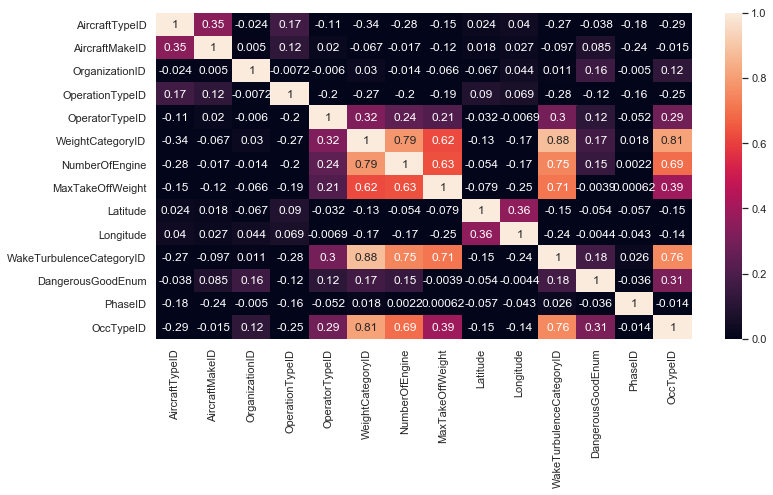

In [48]:
fig, ax = plt.subplots(1, 1, figsize = (12, 6))
sns.heatmap(df.corr(), annot=True, ax = ax, vmin = 0, vmax = 1)

# Checking for duplicates

In [49]:
df.duplicated(subset=None, keep="first").sum()
#found two duplicates
df.shape

(43814, 15)

In [50]:
col=df.columns
df=df.drop_duplicates(col, keep="first")
df.shape
#Removed the duplicates

(43745, 15)

# Find nulls and remove it

In [51]:
df.isnull().sum().sum()
#gives total number of np.nan in the dataframe

24931

In [52]:
df=df.dropna()
#dropped the nulls and update the dataframe
df.shape

(27665, 15)

# Splitting the dataframe in: (feature,target)

In [53]:
x=df[features]
y=df[target]

In [54]:
# Making the target as category
y=y.astype("category")

# TypeCasting the features which are required for our model
x.AircraftTypeID=x.AircraftTypeID.astype("int64")
#x.OccTime=x.OccTime.astype("int64")
x.dtypes

AircraftTypeID                int64
AircraftMakeID              float64
OrganizationID              float64
OperationTypeID             float64
OperatorTypeID              float64
WeightCategoryID            float64
NumberOfEngine              float64
MaxTakeOffWeight            float64
Latitude                    float64
Longitude                   float64
OccTime                      object
WakeTurbulenceCategoryID    float64
DangerousGoodEnum           float64
PhaseID                     float64
dtype: object

In [55]:
label_encoder=LabelEncoder()
x["OrganizationID"]=label_encoder.fit_transform(x["OrganizationID"])
x["AircraftTypeID"]=label_encoder.fit_transform(x["AircraftTypeID"])
x["OccTime"]=label_encoder.fit_transform(x["OccTime"])

NameError: name 'LabelEncoder' is not defined

In [ ]:
"""temp=[]
for i in label_encoder.fit_transform(x["AircraftTypeID"]):
    if i not in temp:
        temp.append(i)
temp"""

In [ ]:
#Checking if features need some more work or not?
x.head(2)
#x.dtypes

In [ ]:
x.dtypes

In [ ]:
len(x.AircraftMakeID.unique())

In [ ]:
x["AircraftMakeID"]=label_encoder.fit_transform(x["AircraftMakeID"])
_y=y.iloc[:,0].values
clock={}
CLOCK={}
for i, v in enumerate(x["AircraftMakeID"]):
    
    if _y[i]==3:
        if v not in clock.keys():
            clock[v]=1
        elif v in clock.keys():
            clock[v]=clock[v]+1
        else:
            print("weird")
        if v not in CLOCK.keys():
            CLOCK[v]=1
        else:
            CLOCK[v]=CLOCK[v]+1
    else:
        if v not in CLOCK.keys():
            CLOCK[v]=1
        else:
            CLOCK[v]=CLOCK[v]+1

            
        #print(v, _y[i])

In [ ]:
len(clock)# OF ACCIDENTS

In [ ]:
len(CLOCK)# OF ACCIDENTS+ # OF INCIDENTS

In [ ]:
final=[]
for key, value in CLOCK.items():
    if key in clock:
        ratio=clock[key]/CLOCK[key]
        temp=(key, ratio)
        final.append(temp)
    else:
        temp=(key, 0)
        final.append(temp)

In [ ]:
final[110]
#clock[79] , CLOCK[79]

### OF ACCIDENTS : (# OF ACCIDENTS+ # OF INCIDENTS)

In [ ]:
_y=y.iloc[:,0].values
_y.shape
y.head()

# Classification

In [ ]:
x.dtypes

# 
OccID : unique ID
AircraftTypeID : 
AircraftMakeID : 
OrganizationID : 
OperationTypeID : 
OperatorTypeID : 
WeightCategoryID : 
YearOfManuf : 
NumberOfEngine : 
MaxTakeOffWeight : 
NumberOfEngine : 
OccDate : 
OccTime : 
Latitude : 
Longitude : 
DamageLevelID : 
WakeTurbulenceCategoryID : 
DangerousGoodEnum : 
PhaseID : 
TotalFatalCount : 


In [ ]:
x.OrganizationID=x.OrganizationID.astype("int64")

In [ ]:
from sklearn.preprocessing import LabelEncoder
label_encoder=LabelEncoder()
x["OrganizationID"]=label_encoder.fit_transform(x["OrganizationID"])

In [ ]:
x.OrganizationID

In [ ]:
# dfa.drop_duplicates(subset ="OccID", 
#                      keep = False, inplace = True) 
# #df.dropna(inplace = True)

### Classify using RFC

In [ ]:
#Using knqk's preprocessing

from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier

In [ ]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.20, random_state=6)

In [ ]:
model = RandomForestClassifier(n_estimators=10, criterion='entropy', random_state=0).fit(x_train, y_train)

In [ ]:
y_pred = model.predict(x_test)
print(y_pred)

In [ ]:
y_test

In [ ]:
print ("The model score test is  " model.score(x_test, y_test)) 

# Clustering

In [ ]:
from sklearn import neighbors
from sklearn.cluster import KMeans

In [ ]:
X_=x
sum_square = {}

for k in range(1, 20):
    kmeans_aviation = KMeans(n_clusters = k).fit(X_)
    sum_square[k] = kmeans_aviation.inertia_
print(X_.shape)
print(X_.columns)
print(X_.head)

In [ ]:
X_.head()

In [ ]:
plt.plot(list(sum_square.keys()), list(sum_square.values()),
         linestyle ='-', marker = 'o', color = 'b',
         markersize = 8,markerfacecolor = 'r')

### Clustering with 5 centers

In [ ]:
kmeans_5 = KMeans(n_clusters=5, random_state=0).fit(X_)
print('Cluster model K=5 inertia score is: ', kmeans_5.inertia_)
y=kmeans_5.predict(X_)

In [ ]:
centers5 = kmeans_5.cluster_centers_
centers5

In [ ]:
X_['klabels_5'] = kmeans_5.labels_

In [ ]:
df.columns

In [ ]:
X_.head()
#X_.shape

In [ ]:
# Y=dfa["OccTypeID"]
# y is your prediction
# compare y and Y in the metrics

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
print(classification_report(df['OccTypeID'], kmeans_5.labels_))

In [ ]:
X_.klabels_5.value_counts()

In [ ]:
df.OccTypeID.value_counts()

### Clustering with 4 centers

In [ ]:
kmeans_4 = KMeans(n_clusters=4, random_state=0).fit(X_)
print('Cluster model K=4 inertia score is: ', kmeans_4.inertia_)
y=kmeans_4.predict(X_)

In [ ]:
centers4 = kmeans_4.cluster_centers_
centers4

In [ ]:
X_['klabels_4'] = kmeans_4.labels_

In [ ]:
df.columns

In [ ]:
X_.head()
#X_.shape

In [ ]:
# Y=dfa["OccTypeID"]
# y is your prediction
# compare y and Y in the metrics

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
print(classification_report(df['OccTypeID'], kmeans_4.labels_))

In [ ]:
print(confusion_matrix(df['OccTypeID'], kmeans_4.labels_))

In [ ]:
from sklearn.metrics import accuracy_score
accuracy_score(df.OccTypeID, kmeans_4.labels_)

In [ ]:
X_.klabels_4.value_counts()

In [ ]:
df.OccTypeID.value_counts()

In [ ]:
f, (ax1, ax2) = plt.subplots(nrows = 1, ncols = 2,
                             sharey = True, figsize = (15,8))

# For original data 
ax1.set_title("Original")
ax1.scatter(x = dfm['MaxTakeOffWeight'], y = dfm['OccTime'], 
            c = dfm['OccTypeID'], cmap='rainbow')


# For fitted with kmeans 
ax2.set_title('K Means (K = 4)')
ax2.scatter(x = X_['MaxTakeOffWeight'], y = X_['OccTime'], 
            c = X_['klabels_4'], cmap='rainbow')
ax2.scatter(x=centers4[:, 7], y=centers4[:, 5],
            c='black',s=300, alpha=0.5);

